In [25]:
try: 
    import seaborn as sns
except:
    !pip install seaborn
    import seaborn as sns
try:
    import pymc as pm # For MCMC
except:
    !pip install pymc
    import pymc as pm
try:
    import arviz as az # For MCMC package
except:
    !pip install arviz
    import arviz as az
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
try:
    import corner
except:
    !pip install corner
    import corner

print(pm.__version__)

5.15.0


In [10]:
def dfg(a,b):
    file_path = 'datasets/Donor%d_CD%d_Genes.csv' %(a,b)
    all_df = pd.read_csv(file_path)
    file_path = 'datasets/mt_genes_metadata.csv'
    dfmeta = pd.read_csv(file_path)
    protein_coding_genes = dfmeta[dfmeta['gene_type'] == 'protein_coding']
    protein_names = protein_coding_genes['gene_name'].tolist()
    df2 = pd.DataFrame([all_df[i] for i in protein_names]).T
    return df2

In [11]:
def normiz_2(df,s_n = 1000):
    df1 = df
    listfinal = [sum(df.iloc[i]) for i in range(len(df))]
    for i in range(len(df)):
        df1.iloc[i] = df1.iloc[i]/listfinal[i] * s_n
    return df1

In [12]:
def lse(a,b):
    x = g_log(normiz_2(dfg(a,b)))[0]
    y = g_log(normiz_2(dfg(a,b)))[1]

    X = np.vstack([np.ones(len(x)), x]).T
    # theta = (X^T X)^(-1) X^T y
    theta = np.linalg.inv(X.T @ X) @ X.T @ y

    a, b = theta
    print(f"Estimated parameters: a = {a}, b = {b}")

    y_pred = a + b * x

    ss_total = np.sum((y - np.mean(y))**2)
    ss_residual = np.sum((y - y_pred)**2)
    r_squared = 1 - (ss_residual / ss_total)

    print(f"R-squared (R^2) value: {r_squared}")
    plt.figure(figsize=(8,8))
    plt.scatter(x, y, label='Observed data')
    plt.plot(x, y_pred, color='red', label='Fitted line')
    plt.xlabel('log(mean)')
    plt.ylabel('log(var)')
    plt.title('Least Squares Estimation of normalised data')
    plt.legend()
    plt.show()

In [13]:
def g_log(df_n):
    df_final = normiz_2(df_n).T
    gene_mean = [np.mean(df_final.iloc[i]) for i in range(13)]
    gene_var = [np.var(df_final.iloc[i]) for i in range(13)]
    log_gene_mean = np.log(gene_mean)
    log_gene_var = np.log(gene_var)
    return log_gene_mean, log_gene_var

def log_gene_plot(df_n):
    df_final = normiz_2(df_n).T
    gene_mean = [np.mean(df_final.iloc[i]) for i in range(13)]
    gene_var = [np.var(df_final.iloc[i]) for i in range(13)]
    log_gene_mean = np.log(gene_mean)
    log_gene_var = np.log(gene_var)
    plt.scatter(log_gene_mean,log_gene_var)

In [14]:
def linfitplot(x,y):
    linear_model = pm.Model()
# Define the PyMC model
    with linear_model:
        # Priors for unknown parameters
        a_prior = pm.Normal('a', mu=0, sigma=10)
        b_prior = pm.Normal('b', mu=0, sigma=10)
        sigma_prior = pm.HalfNormal('sigma', sigma=2)

        # Expected value of outcome
        mu = a_prior * x + b_prior

        # Likelihood (sampling distribution) of observations
        vals = pm.Normal('vals', mu=mu, sigma=sigma_prior, observed=y)
        
        step = pm.Slice()
        tracel = pm.sample(1000, step=step, return_inferencedata=True)
        ppc_samples = pm.sample_posterior_predictive(tracel)
    
    ppc_vals = np.asarray(ppc_samples["posterior_predictive"].vals)
    
    for y_i in ppc_vals[0]:
        plt.plot(x,y_i,alpha=0.1,color="pink")
    
    plt.plot(x,y,"ko",label="Data")
    plt.legend()
    plt.xlabel("x")
    plt.xlabel("y")

def lse_general(x,y):
    X = np.vstack([np.ones(len(x)), x]).T
    # theta = (X^T X)^(-1) X^T y
    theta = np.linalg.inv(X.T @ X) @ X.T @ y

    a, b = theta
    print(f"Estimated parameters: a = {a}, b = {b}")

    y_pred = a + b * x

    ss_total = np.sum((y - np.mean(y))**2)
    ss_residual = np.sum((y - y_pred)**2)
    r_squared = 1 - (ss_residual / ss_total)

    print(f"R-squared (R^2) value: {r_squared}")
    plt.figure(figsize=(8,8))

    plt.scatter(x, y, label='Observed data',s= 1)
    plt.plot(x, y_pred, color='red', label='Fitted line')
    
    plt.xlabel('MT-CO1')
    plt.ylabel('MT-CO2')
    plt.title('Linear fit between MT-CO1 and MT-CO2')
    plt.legend()
    plt.show()

c:\Users\ruizc\anaconda3\Lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


Text(0.5, 1.05, 'Pairplot of MT-CO1,MT-CO2,MT-CO3')

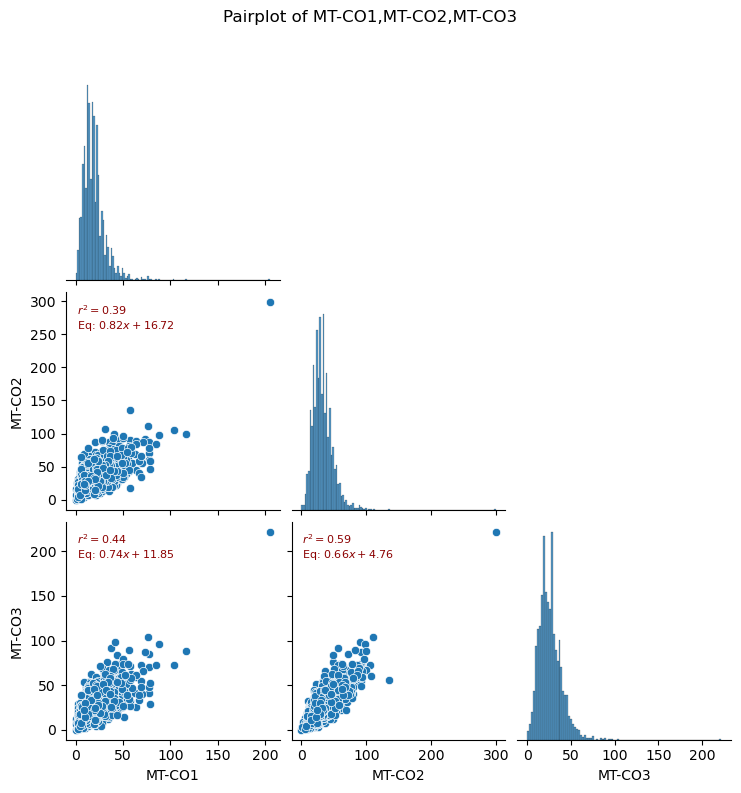

In [26]:
def r2(x, y, ax=None, **kws):
    ax = ax or plt.gca()
    slope, intercept, r_value, p_value, std_err = st.linregress(x=x, y=y)
    ax.annotate(f'$r^2 = {r_value ** 2:.2f}$\nEq: ${slope:.2f}x{intercept:+.2f}$',
                xy=(.05, .95), xycoords=ax.transAxes, fontsize=8,
                color='darkred', backgroundcolor='#FFFFFF99', ha='left',va='top')
df1 = pd.DataFrame(dfg(1,4),columns=['MT-CO1','MT-CO2','MT-CO3'])
g= sns.pairplot(df1,corner=True).map_lower(r2)
g.fig.suptitle("Pairplot of MT-CO1,MT-CO2,MT-CO3",y = 1.05)

Estimated parameters: a = 16.71967287814771, b = 0.8241328943641942
R-squared (R^2) value: 0.39226606328996305


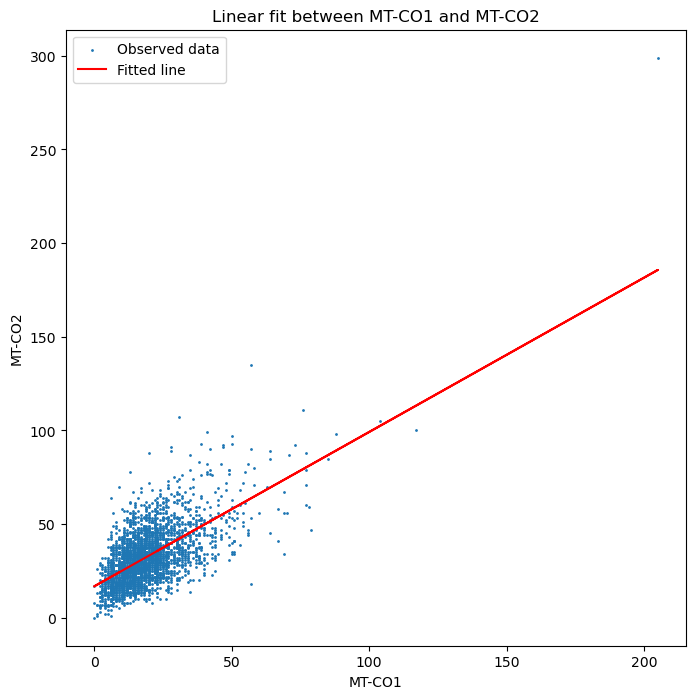

In [ ]:
x = dfg(1,4)['MT-CO1']
y = dfg(1,4)['MT-CO2']
lse_general(x,y)



In [ ]:
dfg(1,4)

,MT-ND1,MT-ND2,MT-CO1,MT-CO2,MT-ATP8,MT-ATP6,MT-CO3,MT-ND3,MT-ND4L,MT-ND4,MT-ND5,MT-ND6,MT-CYB
0,12,3,23,53,34,3,38,6,20,5,7,7,20
1,8,4,24,35,10,2,34,3,15,7,6,1,17
2,7,2,16,30,8,1,19,6,20,3,7,0,15
3,3,2,25,23,14,5,23,2,13,4,6,3,14
4,6,3,6,26,14,1,11,4,14,0,2,0,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2883,4,0,20,15,11,3,11,2,5,2,3,0,4
2884,2,5,13,28,12,2,18,6,14,2,2,1,8
2885,5,0,10,22,13,1,14,4,6,7,5,1,20
2886,6,12,36,45,19,2,40,5,20,8,7,0,37


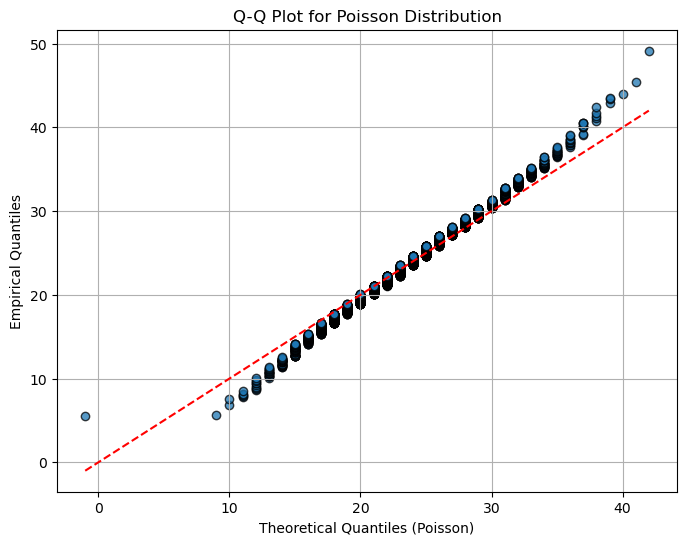

In [ ]:
import pandas as pd
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt

# Example gene expression data (replace with your data)
data = normiz_2(dfg(1,4),1000/(np.e ** 1.9340102220340734))
df = pd.DataFrame(data)

# Select the gene of interest
gene_expression = df['MT-CO3']

# Estimate lambda (mean of the gene expression)
lambda_est = np.mean(gene_expression)

# Generate theoretical quantiles for the Poisson distribution
theoretical_quantiles = stats.poisson.ppf(
    np.linspace(0, 1, len(gene_expression)), mu=lambda_est)

# Sort the empirical gene expression data
empirical_quantiles = np.sort(gene_expression)

# Create the Q-Q plot
plt.figure(figsize=(8, 6))
plt.scatter(theoretical_quantiles, empirical_quantiles, edgecolor='k', alpha=0.75)
plt.plot(theoretical_quantiles, theoretical_quantiles, color='red', linestyle='--')
plt.xlabel('Theoretical Quantiles (Poisson)')
plt.ylabel('Empirical Quantiles')
plt.title('Q-Q Plot for Poisson Distribution')
plt.grid(True)
plt.show()


Estimated parameters: a = 1.9340102220340734, b = 1.0993566989318007
R-squared (R^2) value: 0.9670751161979677


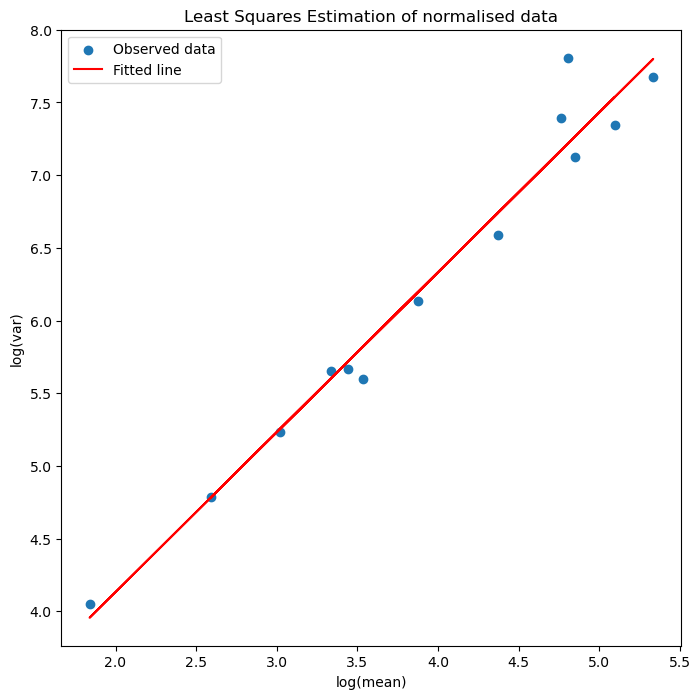

In [ ]:
lse(1,4)

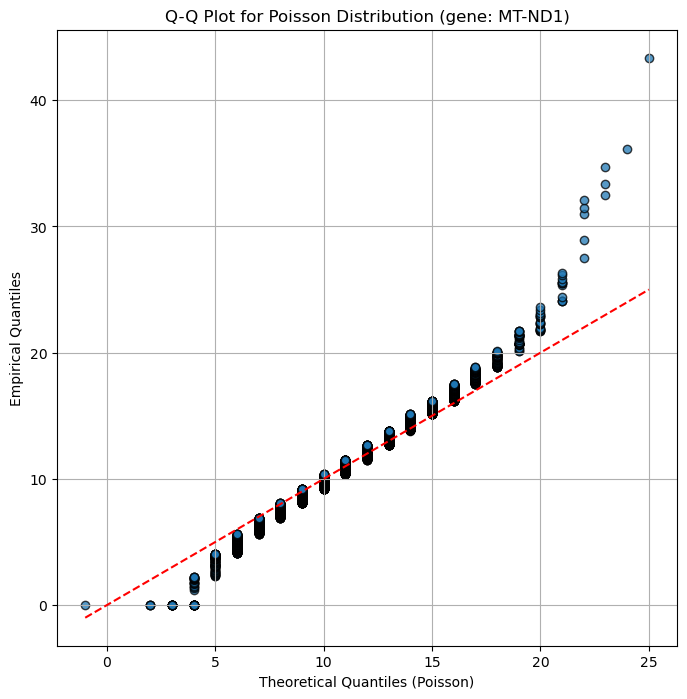

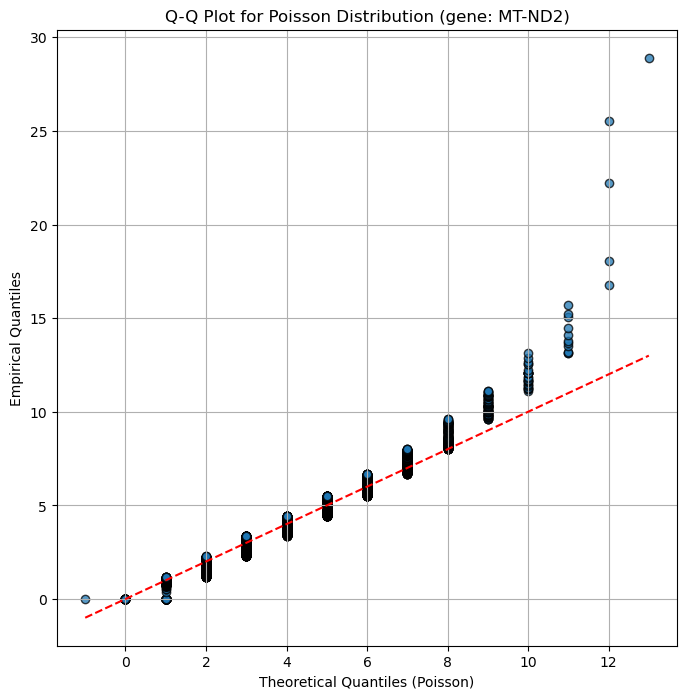

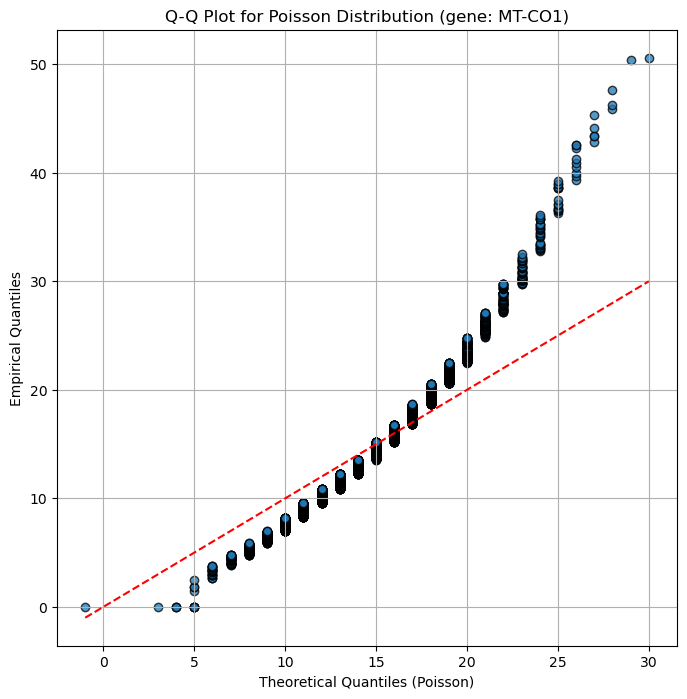

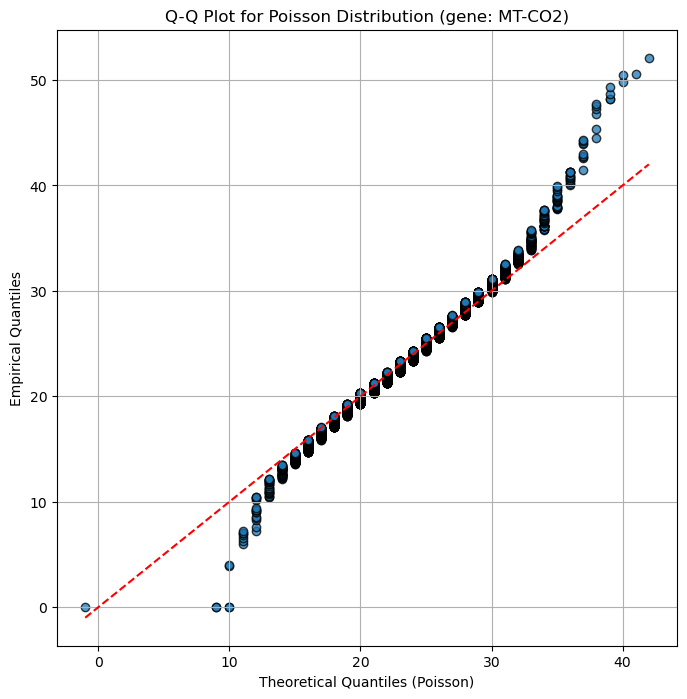

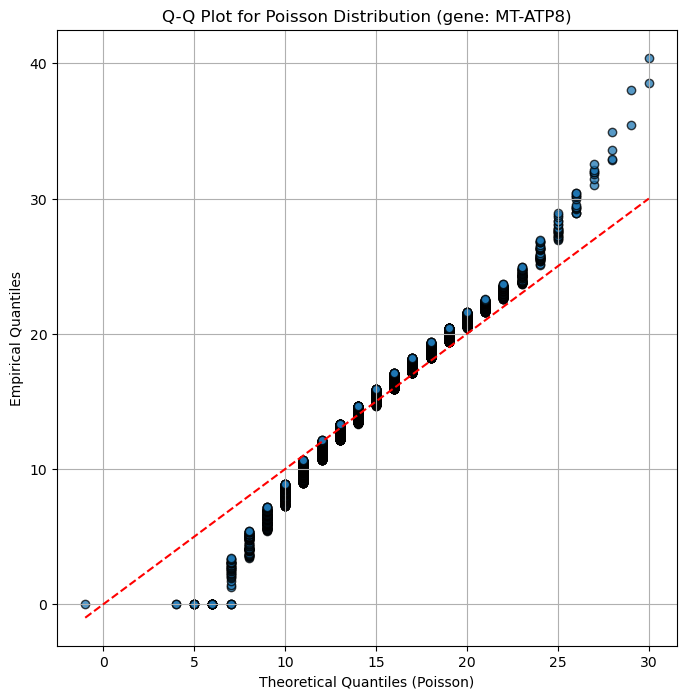

...

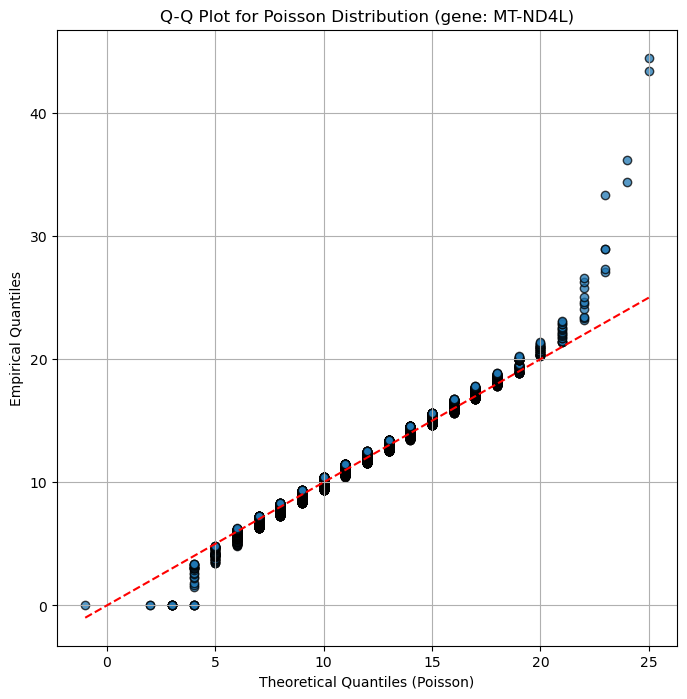

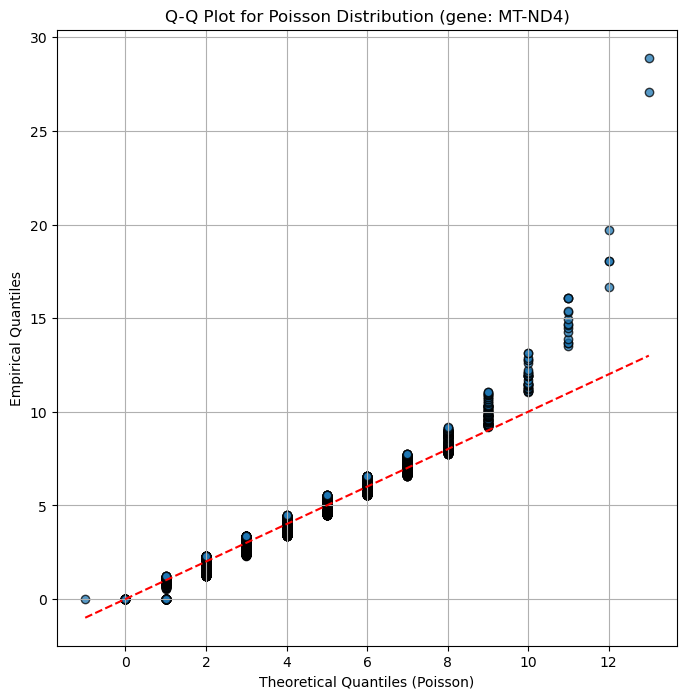

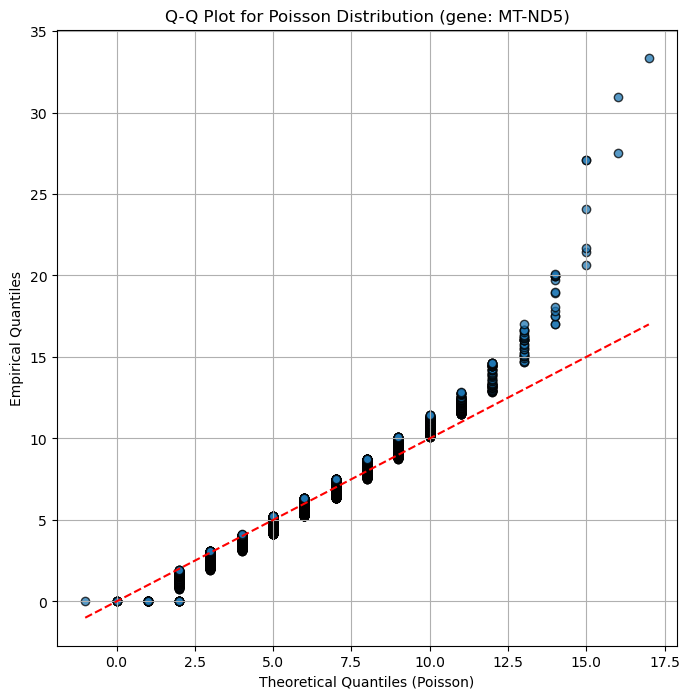

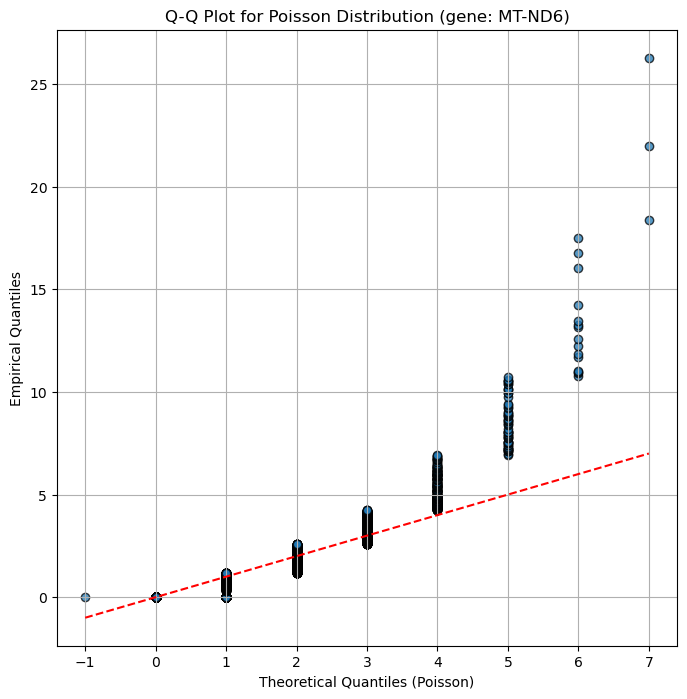

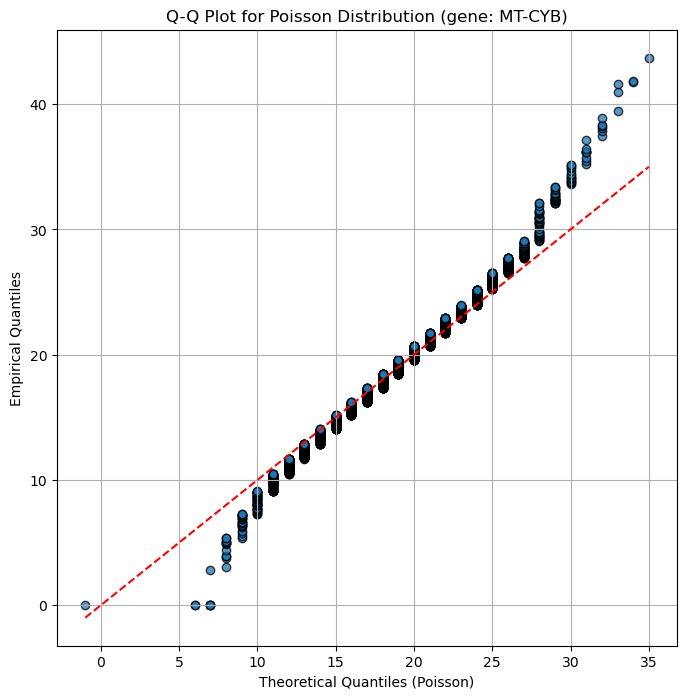

In [18]:
import pandas as pd
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt

# Example gene expression data (replace with your data)
data = normiz_2(dfg(2,4),1000/(np.e ** 1.9340102220340734))
df = pd.DataFrame(data)
for i in df.columns:
# Select the gene of interest
    gene_expression = df[i]

    # Estimate lambda (mean of the gene expression)
    lambda_est = np.mean(gene_expression)

    # Generate theoretical quantiles for the Poisson distribution
    theoretical_quantiles = stats.poisson.ppf(
        np.linspace(0, 1, len(gene_expression)), mu=lambda_est)

    # Sort the empirical gene expression data
    empirical_quantiles = np.sort(gene_expression)

    # Create the Q-Q plot
    plt.figure(figsize=(8, 8))
    plt.scatter(theoretical_quantiles, empirical_quantiles, edgecolor='k', alpha=0.75)
    plt.plot(theoretical_quantiles, theoretical_quantiles, color='red', linestyle='--')
    
    plt.xlabel('Theoretical Quantiles (Poisson)')
    plt.ylabel('Empirical Quantiles')
    plt.title('Q-Q Plot for Poisson Distribution (gene: %s)' %(i))
    output_path = 'Q-Q_Plot_gene_%s.png' %(i) # You can change the file name and format here
    plt.savefig(output_path, format='png', dpi=300, bbox_inches='tight')
    plt.grid(True)
    plt.show()
    

Estimated parameters: a = 1.934010222034055, b = 1.099356698931805
R-squared (R^2) value: 0.9670751161979677


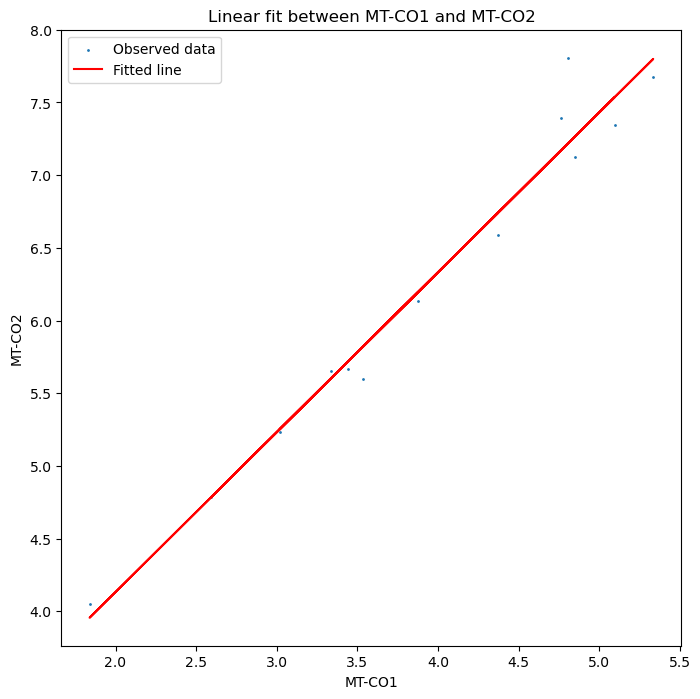

In [ ]:
data = normiz_2(dfg(1,4),1000/(np.e ** 1.9340102220340734))
x = g_log(data)[0]
y = g_log(data)[1]
lse_general(x,y)

Estimated parameters: a = nan, b = nan
R-squared (R^2) value: 1.0


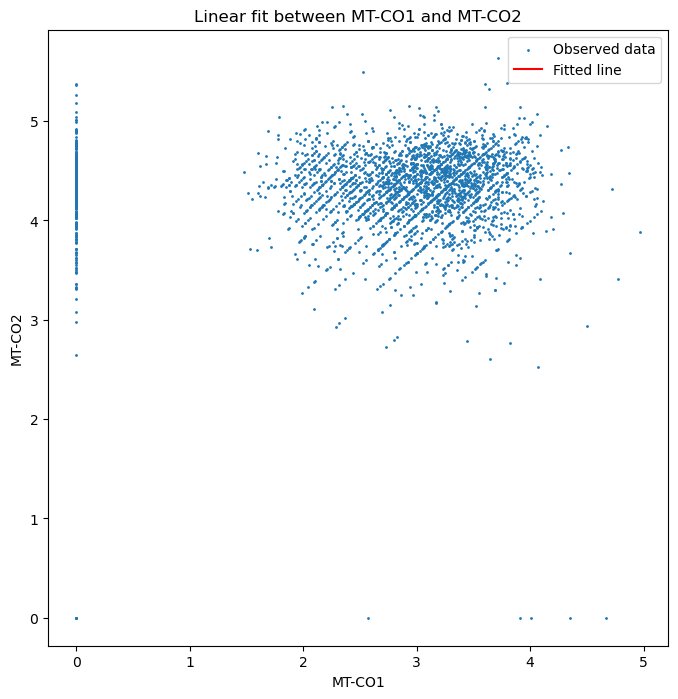

In [ ]:
x = normiz_2(dfg(1,4))['MT-ND4']
y = normiz_2(dfg(1,4))['MT-ND4L']
lse_general(np.log(x+1),np.log(y+1))


c:\Users\ruizc\anaconda3\Lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
c:\Users\ruizc\anaconda3\Lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
c:\Users\ruizc\anaconda3\Lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


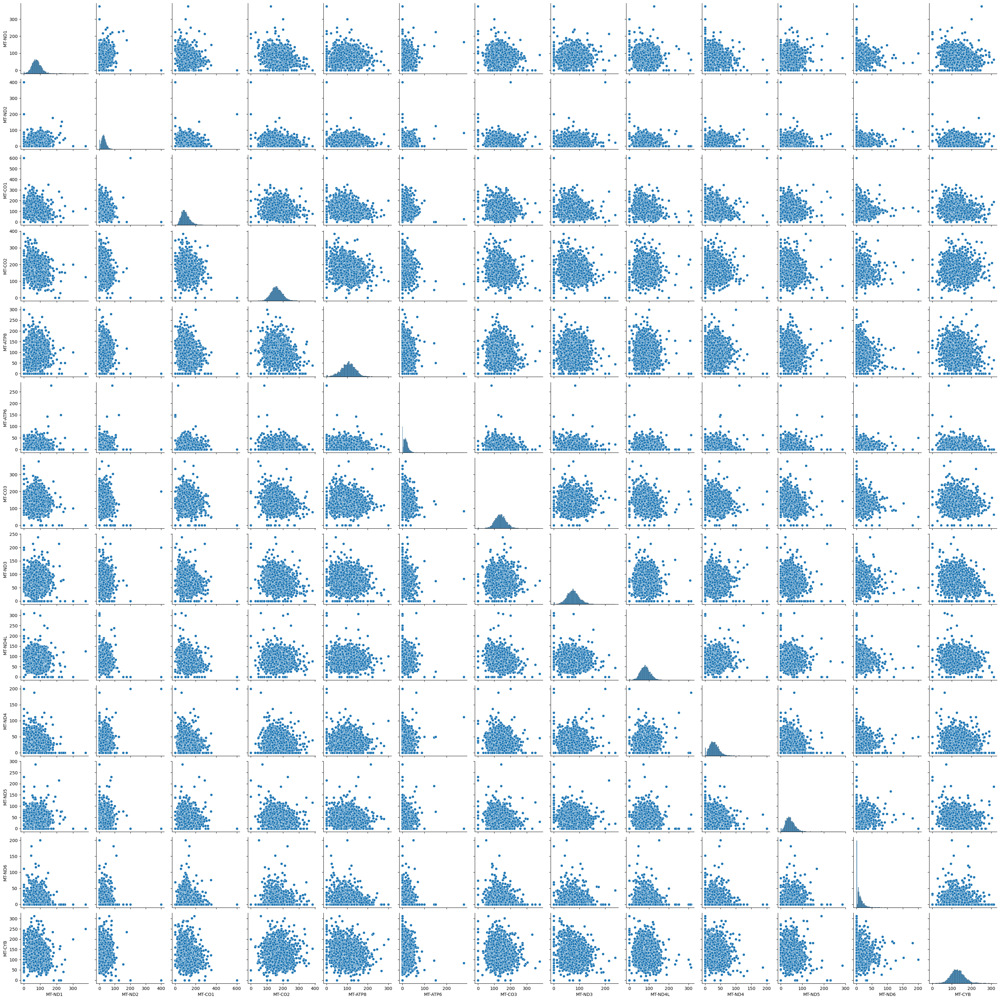

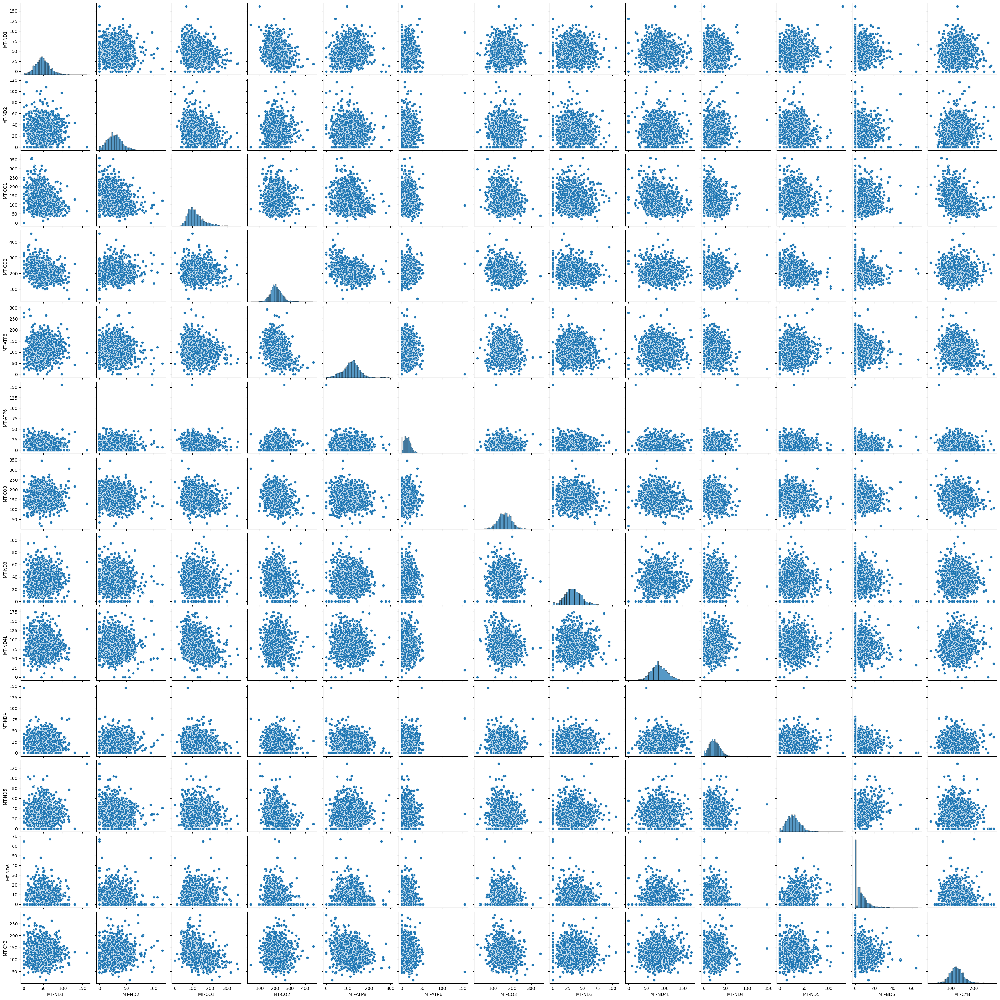

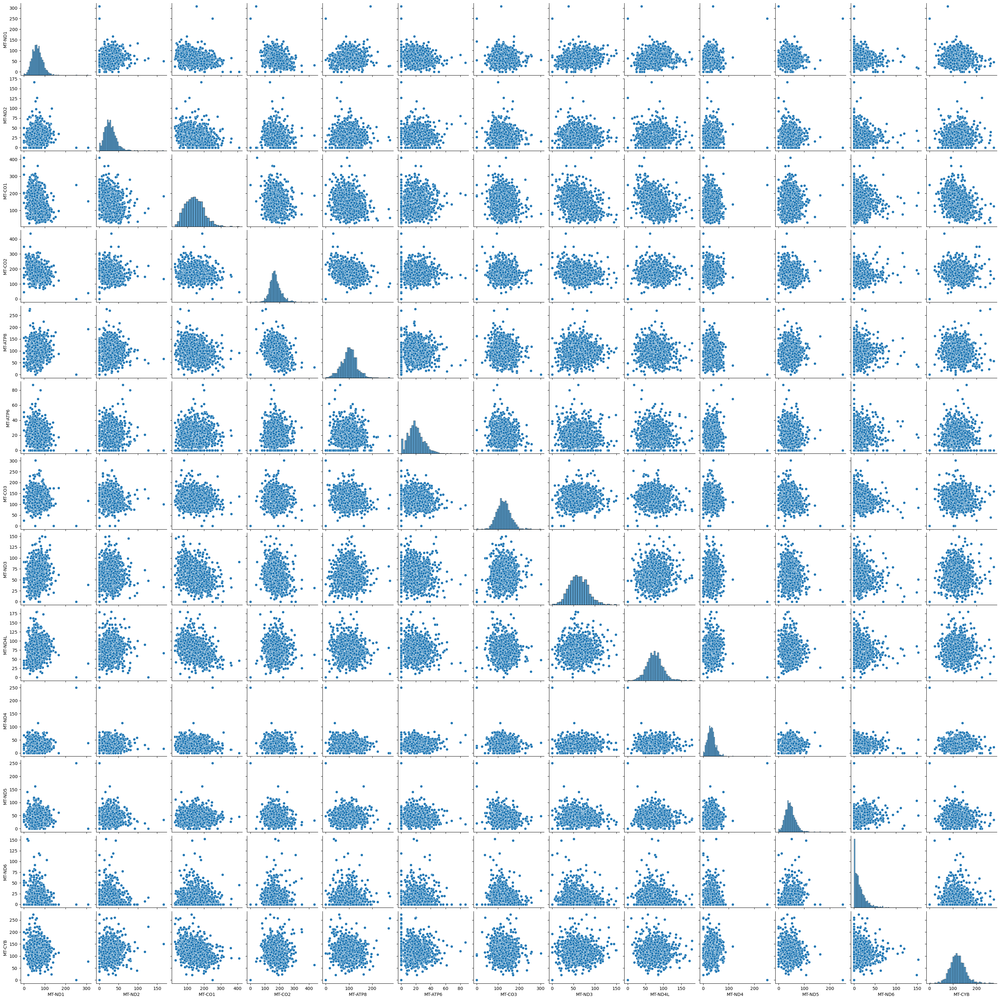

In [ ]:
sns.pairplot(normiz_2(dfg(2,4)))
sns.pairplot(normiz_2(dfg(1,8)))
sns.pairplot(normiz_2(dfg(2,8)))


c:\Users\ruizc\anaconda3\Lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
c:\Users\ruizc\anaconda3\Lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
c:\Users\ruizc\anaconda3\Lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
c:\Users\ruizc\anaconda3\Lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


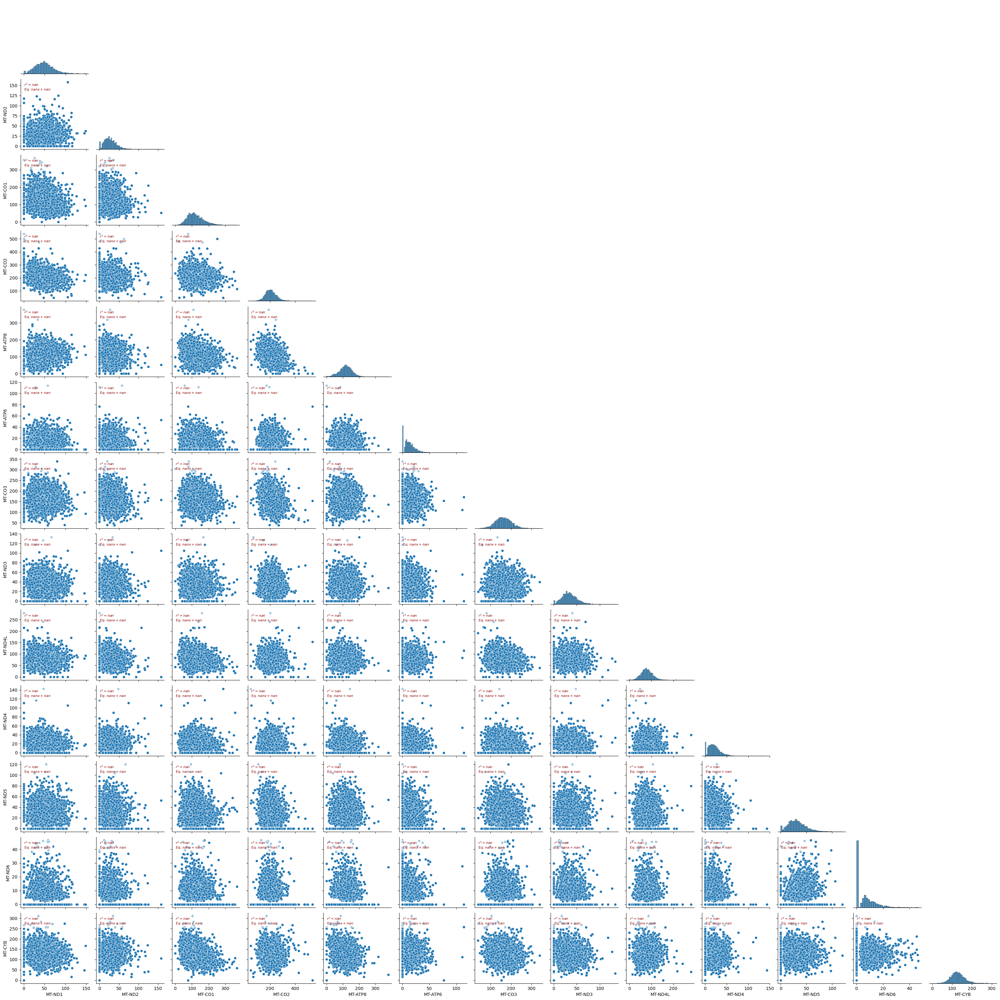

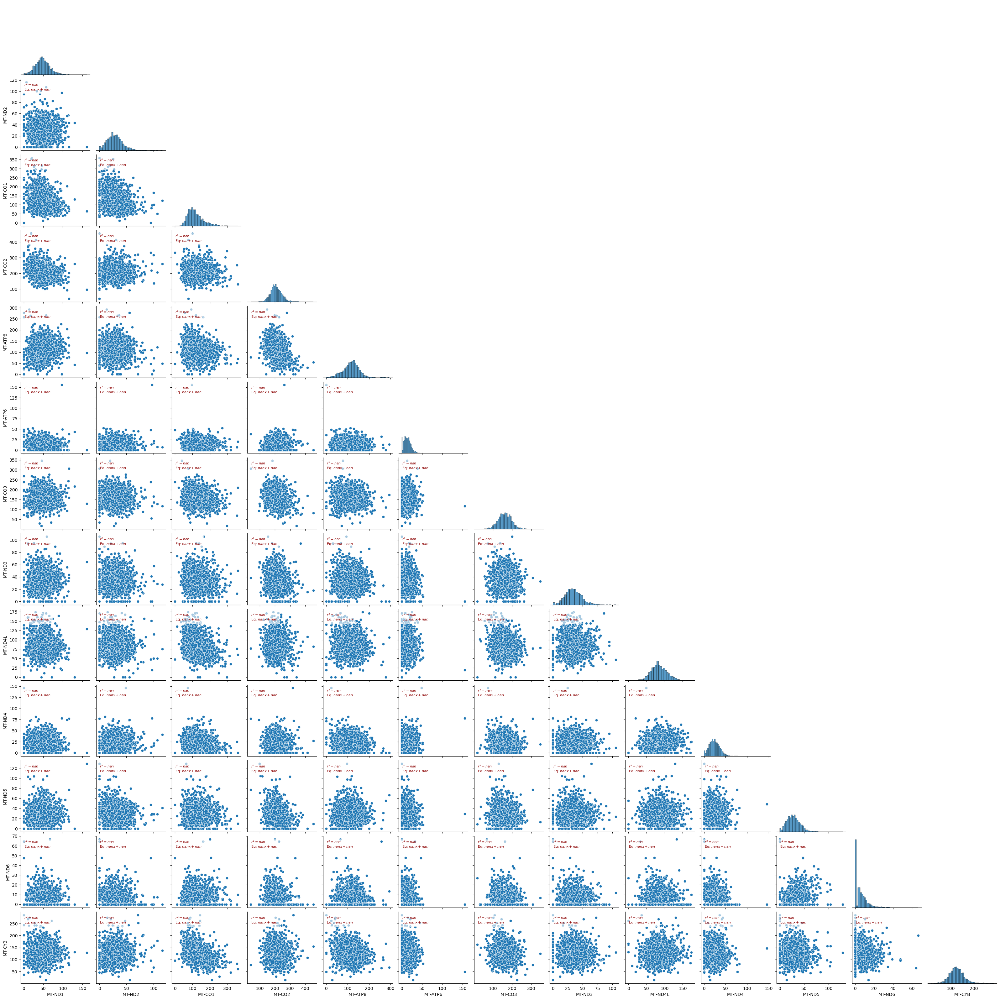

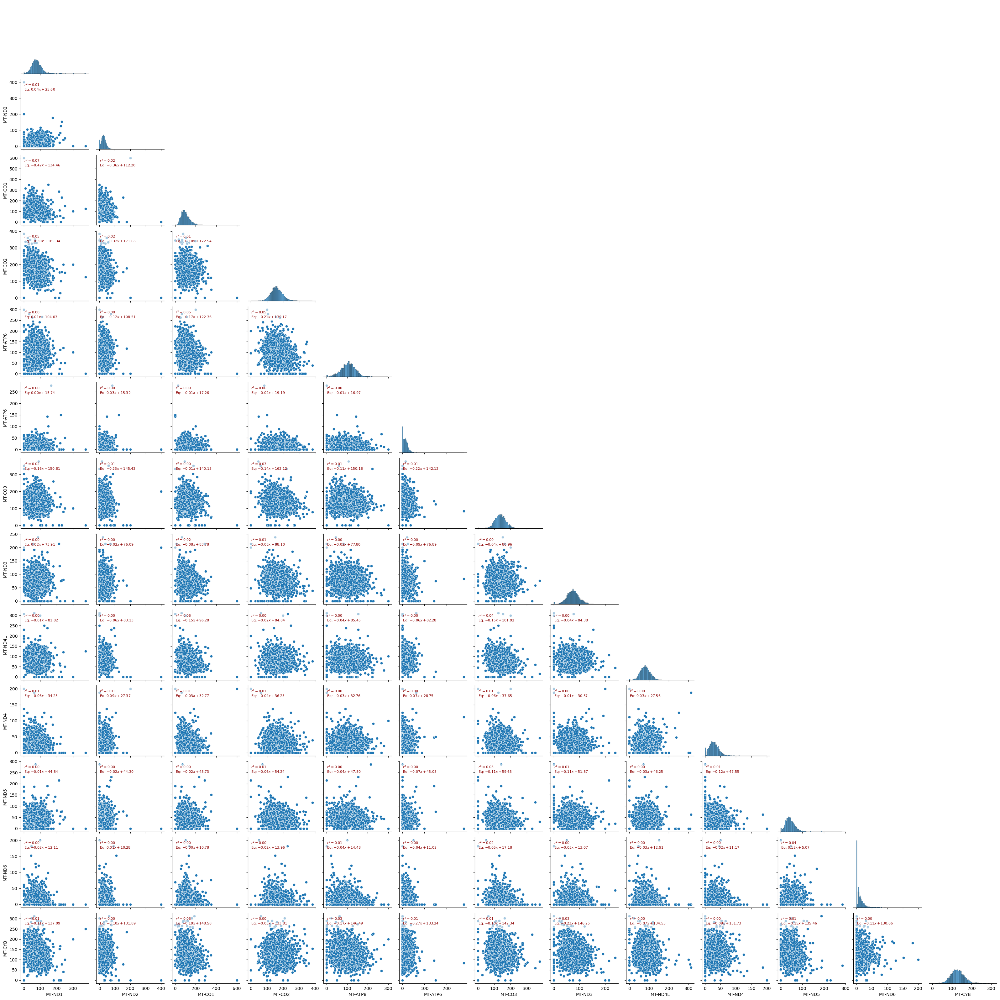

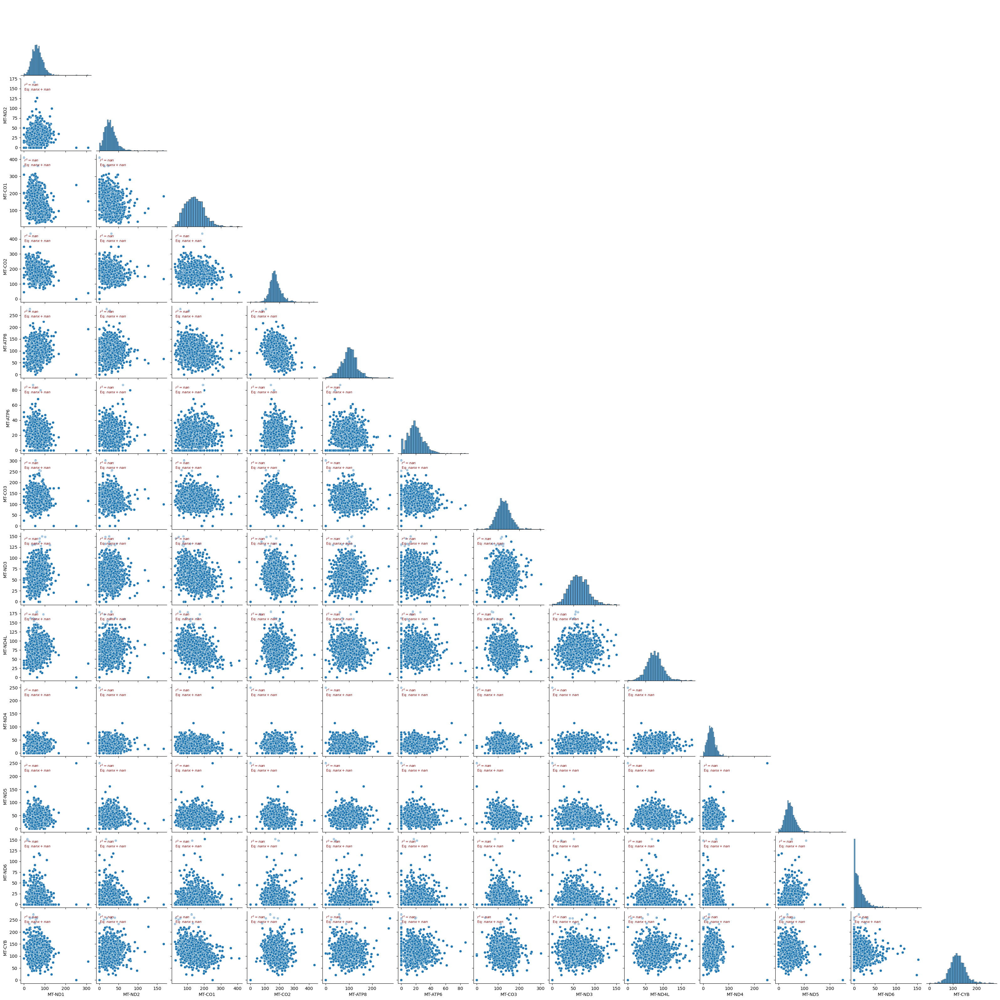

In [23]:
# sns.pairplot(normiz_2(dfg(2,8)))
import scipy.stats as st
def r2(x, y, ax=None, **kws):
    ax = ax or plt.gca()
    slope, intercept, r_value, p_value, std_err = st.linregress(x=x, y=y)
    ax.annotate(f'$r^2 = {r_value ** 2:.2f}$\nEq: ${slope:.2f}x{intercept:+.2f}$',
                xy=(.05, .95), xycoords=ax.transAxes, fontsize=8,
                color='darkred', backgroundcolor='#FFFFFF99', ha='left',va='top')
sns.pairplot(normiz_2(dfg(1,4)),corner=True).map_lower(r2)
sns.pairplot(normiz_2(dfg(1,8)),corner=True).map_lower(r2)
sns.pairplot(normiz_2(dfg(2,4)),corner=True).map_lower(r2)
sns.pairplot(normiz_2(dfg(2,8)),corner=True).map_lower(r2)


In [ ]:
import numpy as np
import scipy.stats as stats
import numpy as np
import scipy.stats as stats

def poisson_goodness_of_fit(data, alpha=0.05):
    """
    Performs a goodness-of-fit test to check if the data follows a Poisson distribution.

    Parameters:
    - data (array-like): The observed data to test.
    - alpha (float): The significance level for the test (default is 0.05).

    Returns:
    - chi2_statistic (float): The Chi-square test statistic.
    - p_value (float): The p-value of the test.
    - conclusion (str): Conclusion whether to reject or not reject the null hypothesis.
    """
    # Estimate the Poisson parameter (lambda)
    lambda_est = np.mean(data)
    
    # Get the observed frequencies
    observed_freq, bins = np.histogram(data, bins=np.arange(data.min(), data.max() + 2) - 0.5)
    
    # Compute the expected frequencies using the Poisson distribution
    expected_freq = len(data) * stats.poisson.pmf(bins[:-1], mu=lambda_est)
    
    # Perform the Chi-square test
    chi2_statistic, p_value = stats.chisquare(f_obs=observed_freq, f_exp=expected_freq)
    
    # Determine if we reject the null hypothesis
    conclusion = 'Reject' if p_value < alpha else 'Do not reject'
    
    return chi2_statistic, p_value, conclusion




def poisson_goodness_of_fit_nonint(data, alpha=0.05, min_exp_count=1):
    """
    Performs a goodness-of-fit test to check if the data follows a Poisson distribution.

    Parameters:
    - data (array-like): The observed data to test.
    - alpha (float): The significance level for the test (default is 0.05).
    - min_exp_count (int): The minimum expected count for a bin to avoid low frequency issues.

    Returns:
    - chi2_statistic (float): The Chi-square test statistic.
    - p_value (float): The p-value of the test.
    - conclusion (str): Conclusion whether to reject or not reject the null hypothesis.
    """
    # Round the non-integer data to the nearest integers
    rounded_data = np.round(data).astype(int)

    # Perform the chi-square goodness-of-fit test for the rounded data
    chi2_stat, p_value, conclusion = poisson_goodness_of_fit(rounded_data, alpha)
    
    return chi2_stat, p_value, conclusion

# Example usage
np.random.seed(42)
data = np.random.exponential(scale=2, size=100)  # Generate non-integer data

chi2_stat, p_val, result = poisson_goodness_of_fit_nonint(data)
print(f"Chi-Square Statistic: {chi2_stat}")
print(f"p-value: {p_val}")
print(f"Conclusion: {result} the null hypothesis that data follows a Poisson distribution.")


c:\Users\ruizc\anaconda3\Lib\site-packages\scipy\stats\_stats_py.py:8042: RuntimeWarning: divide by zero encountered in scalar divide
  relative_diff = (np.abs(f_obs_sum - f_exp_sum) /


ValueError: For each axis slice, the sum of the observed frequencies must agree with the sum of the expected frequencies to a relative tolerance of 1e-08, but the percent differences are:
inf

In [ ]:
import numpy as np
from scipy.stats import poisson, chisquare

# Sample non-integer data
data = [2.3, 3.5, 1.7, 4.2, 2.8, 3.1, 2.9, 4.5, 3.7, 3.3]

# Estimate lambda (mean of data)
lambda_est = np.mean(data)

# Define bins
bins = [1, 2, 3, 4, 5]

# Calculate observed frequencies
observed_counts, _ = np.histogram(data, bins=bins)
print(f"Observed counts: {observed_counts}")

# Calculate expected frequencies for each bin using the Poisson PMF
total_count = len(data)
expected_probs = [poisson.pmf(k, lambda_est) for k in range(len(bins)-1)]
expected_counts = np.array(expected_probs) * total_count
print(f"Expected counts: {expected_counts}")

# Perform the Chi-square goodness of fit test
chi2_stat, p_value = chisquare(f_obs=observed_counts, f_exp=expected_counts)
print(f"Chi-square Statistic: {chi2_stat}, p-value: {p_value}")

# Interpretation
if p_value < 0.05:
    print("Reject the null hypothesis: The data does not follow a Poisson distribution.")
else:
    print("Fail to reject the null hypothesis: The data follows a Poisson distribution.")


Observed counts: [1 3 4 2]
Expected counts: [0.40762204 1.30439053 2.08702484 2.22615983]


ValueError: For each axis slice, the sum of the observed frequencies must agree with the sum of the expected frequencies to a relative tolerance of 1e-08, but the percent differences are:
0.6596967028533297

In [ ]:
len(dfg(2,4))

4034

In [ ]:
dft = normiz_2(dfg(1,4),1000/(np.e ** 1.9340102220340734))

In [ ]:
for i in range(13):
    print(np.mean(dft.T.iloc[i]))

6.956974384445941
4.06298143637062
17.72040927518205
30.003584999613533
16.89609091699336
1.9305017637519097
23.670847731125743
4.953305766890104
11.465691684900166
2.9541769306885444
4.517935185409167
0.9095526410604874
18.525234832852895


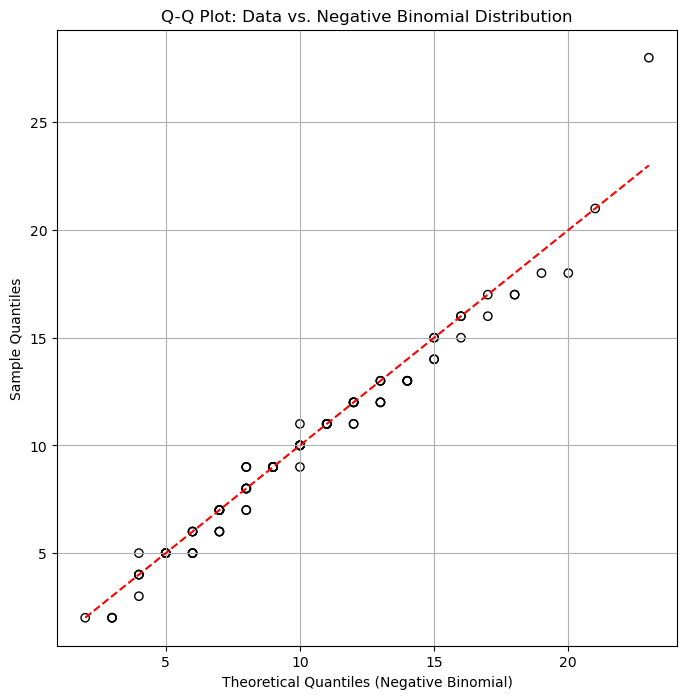

In [ ]:
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt

def qq_plot_neg_binom(data, n, p):
    """
    Creates a Q-Q plot for a sequence of numbers against a negative binomial distribution.

    Parameters:
    - data (array-like): The observed data to test.
    - n (int): Number of failures until the experiment is stopped.
    - p (float): Probability of success in each trial.
    """
    # Sort the data
    data = np.sort(data)
    
    # Generate the theoretical quantiles from the negative binomial distribution
    quantiles = np.arange(1, len(data) + 1) / (len(data) + 1)
    neg_binom_quantiles = stats.nbinom.ppf(quantiles, n, p)
    
    # Create the Q-Q plot
    plt.figure(figsize=(8, 8))
    plt.scatter(neg_binom_quantiles, data, edgecolor='k', facecolor='none')
    plt.plot([min(neg_binom_quantiles), max(neg_binom_quantiles)], 
             [min(neg_binom_quantiles), max(neg_binom_quantiles)], 
             color='red', linestyle='--')
    plt.xlabel('Theoretical Quantiles (Negative Binomial)')
    plt.ylabel('Sample Quantiles')
    plt.title('Q-Q Plot: Data vs. Negative Binomial Distribution')
    plt.grid(True)
    plt.show()

# Example usage
np.random.seed(42)
data = np.random.negative_binomial(n=10, p=0.5, size=100)  # Generate sample data
qq_plot_neg_binom(data, n=10, p=0.5)


Estimated parameters: a = 1.9340102220340734, b = 1.0993566989318007
R-squared (R^2) value: 0.9670751161979677


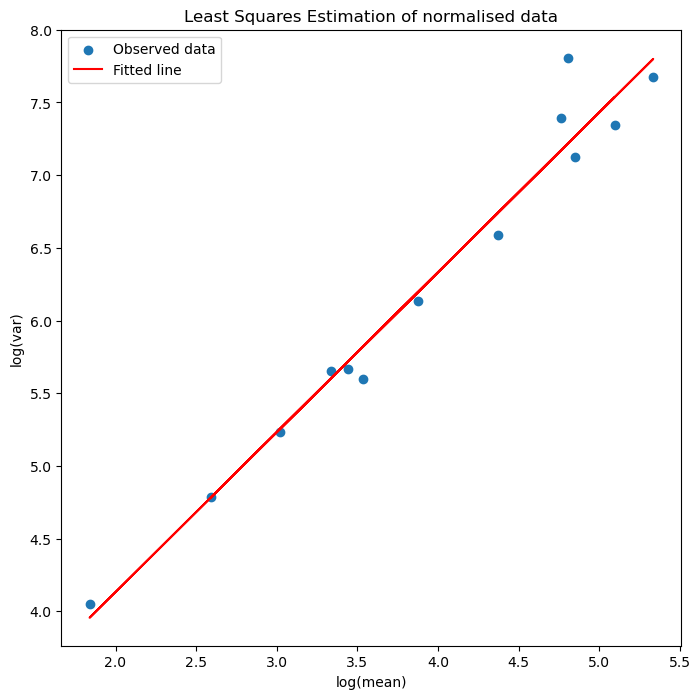

In [ ]:
lse(1,4)
